## Setting up working environment
You will need to install pytorch and import some utilities by running the following cell:

In [1]:
!pip install -q torch torchvision altair seaborn
!git clone -q https://github.com/afspies/icl_dl_cw2_utils
from icl_dl_cw2_utils.utils.plotting import plot_tsne
from pathlib import Path
import tqdm

import matplotlib.pyplot as plt

fatal: destination path 'icl_dl_cw2_utils' already exists and is not an empty directory.


Here we have some default pathing options which vary depending on the environment you are using. You can of course change these as you please.

In [2]:
WORKING_ENV = 'PAPERSPACE' # Can be LABS, COLAB or PAPERSPACE
USERNAME = 'ed1922' # If working on Lab Machines - Your college username
assert WORKING_ENV in ['LABS', 'COLAB', 'PAPERSPACE']

if WORKING_ENV == 'COLAB':
    from google.colab import drive
    %load_ext google.colab.data_table
    content_path = '/content/drive/MyDrive/DL_CW_2'
    data_path = './data/'
    drive.mount('/content/drive/') # Outputs will be saved in your google drive
    %cd $content_path

elif WORKING_ENV == 'LABS':
    content_path = '~/Documents/dl_cw_2' # You may want to change this
    # Your python env and training data should be on bitbucket
    data_path = f'/vol/bitbucket/{USERNAME}/dl_cw_data/'

else: # Using Paperspace
    # Paperspace does not properly render animated progress bars
    # Strongly recommend using the JupyterLab UI instead of theirs
    !pip install ipywidgets 
    content_path = '/notebooks'
    data_path = './data/'

content_path = Path(content_path)

## Introduction

For this coursework, you are asked to implement two commonly used generative models:
1. A **Variational Autoencoder (VAE)**
2. A **Deep Convolutional Generative Adversarial Network (DCGAN)**

For the first part you will the MNIST dataset https://en.wikipedia.org/wiki/MNIST_database and for the second the CIFAR-10 (https://www.cs.toronto.edu/~kriz/cifar.html).

Each part is worth 50 points. 

The emphasis of both parts lies in understanding how the models behave and learn, however, some points will be available for getting good results with your GAN (though you should not spend too long on this).

# Part 1 - Variational Autoencoder

## Part 1.1 (25 points)
**Your Task:**

a. Implement the VAE architecture with accompanying hyperparameters. More marks are awarded for using a Convolutional Encoder and Decoder.

b. Design an appropriate loss function and train the model.


In [31]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler, Dataset
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_VAE/'):
    os.makedirs(content_path/'CW_VAE/')

if not os.path.exists(data_path):
    os.makedirs(data_path)

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

Using cuda


In [32]:
sns.set_style('darkgrid') 
plt.rc('axes', labelsize=14)    
plt.rc('xtick', labelsize=13)    
plt.rc('ytick', labelsize=13)    
plt.rc('legend', fontsize=13)    
plt.rc('font', size=13)

---
## Part 1.1a: Implement VAE (25 Points)
### Hyper-parameter selection


In [103]:
# Necessary Hyperparameters 
num_epochs = 10
learning_rate = 0.005
batch_size = 128
latent_dim = 16 # Choose a value for the size of the latent space

# Additional Hyperparameters 
beta = 50 #30 is good
var_likelihood = 0.5

# (Optionally) Modify transformations on input
transform = transforms.Compose([
    transforms.ToTensor(),
])

# (Optionally) Modify the network's output for visualizing your images
def denorm(x):
    return x

### Data loading


In [104]:
train_dat = datasets.MNIST(
    data_path, train=True, download=True, transform=transform
)
test_dat = datasets.MNIST(data_path, train=False, transform=transform)

n = len(train_dat)
n_val = int(n/10)
train_set, val_set = torch.utils.data.random_split(train_dat, [n-n_val, n_val])

print(len(train_set), len(val_set), len(test_dat))

loader_train = DataLoader(train_dat, batch_size, shuffle=True)
loader_test = DataLoader(test_dat, batch_size, shuffle=False)
#Add a validation set
loader_val = DataLoader(val_set, batch_size, shuffle=True)

# Don't change 
sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[:32, :, :, :]
save_image(fixed_input, content_path/'CW_VAE/image_original.png')

54000 6000 10000


### Model Definition

<figure>
  <img src="https://blog.bayeslabs.co/assets/img/vae-gaussian.png" style="width:60%">
  <figcaption>
    Fig.1 - VAE Diagram (with a Guassian prior), taken from <a href="https://blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae.html">1</a>.
  </figcaption>
</figure>


You will need to define:
* The hyperparameters
* The constructor
* encode
* reparametrize
* decode
* forward



Hints:
- It is common practice to encode the log of the variance, rather than the variance
- You might try using BatchNorm

In [105]:
# *CODE FOR PART 1.1a IN THIS CELL*

class VAE(nn.Module):
    def __init__(self, latent_dm, out_channels=64, kernel_size=3, init_channels=8):
        super(VAE, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # encoder
        self.enc1 = nn.Conv2d(
            in_channels=1, out_channels=init_channels, kernel_size=kernel_size, 
            stride=2, padding=1
        )
        self.enc2 = nn.Conv2d(
            in_channels=init_channels, out_channels=init_channels*2, kernel_size=kernel_size, 
            stride=2, padding=1
        )
        self.enc3 = nn.Conv2d(
            in_channels=init_channels*2, out_channels=init_channels*4, kernel_size=kernel_size, 
            stride=2, padding=1
        )
        self.enc4 = nn.Conv2d(
            in_channels=init_channels*4, out_channels=out_channels, kernel_size=kernel_size, 
            stride=2, padding=0
        )
        # fully connected layers for learning representations
        self.fc1 = nn.Linear(out_channels, 128)
        self.fc_mu = nn.Linear(128, latent_dim)
        self.fc_log_var = nn.Linear(128, latent_dim)
        self.fc2 = nn.Linear(latent_dim, 64)

        # decoder 
        self.dec1 = nn.ConvTranspose2d(
            in_channels=64, out_channels=init_channels*8, kernel_size=kernel_size, 
            stride=1, padding=0
        )
        self.dec2 = nn.ConvTranspose2d(
            in_channels=init_channels*8, out_channels=init_channels*4, kernel_size=kernel_size, 
            stride=2, padding=0
        )
        self.dec3 = nn.ConvTranspose2d(
            in_channels=init_channels*4, out_channels=init_channels*2, kernel_size=kernel_size, 
            stride=2, padding=1, output_padding=0
        )
        self.dec4 = nn.ConvTranspose2d(
            in_channels=init_channels*2, out_channels=1, kernel_size=kernel_size, 
            stride=2, output_padding=1
        )
      
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    @torch.jit.export    
    def encode(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        # encoding
        x = F.relu(self.enc1(x))
        x = F.relu(self.enc2(x))
        x = F.relu(self.enc3(x))
        x = F.relu(self.enc4(x))
        #print(x.size())
        batch = x.size(0)
        #print(batch)
        x = F.adaptive_avg_pool2d(x, 1).reshape(batch, -1)
        #print(x.size())
        hidden = self.fc1(x)
        #print(hidden.size())
        # get `mu` and `log_var`
        mu = self.fc_mu(hidden)
        logvar = self.fc_log_var(hidden)
        #print(mu.size())
        #print(logvar.size())

        return mu, logvar

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    @torch.jit.export
    def reparametrize(self, mu, logvar):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        epsilon = torch.randn_like(mu)
        z_reparam = mu + epsilon*torch.exp(0.5*logvar)
        return z_reparam
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    @torch.jit.export
    def decode(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        x = F.relu(self.dec1(z))
        x = F.relu(self.dec2(x))
        x = F.relu(self.dec3(x))
        recon = torch.sigmoid(self.dec4(x))
        return recon
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
    @torch.jit.export
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        mu, logvar = self.encode(x)
        # get the latent vector through reparameterization
        z = self.reparametrize(mu, logvar)
        z = self.fc2(z) 
        z = z.view(-1, 64, 1, 1)
        recon = self.decode(z)

        return recon, mu, logvar

        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

model = VAE(latent_dim).to(device)
params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print("Total number of parameters is: {}".format(params))
print(model)
# optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

Total number of parameters is: 98081
VAE(
  (enc1): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (enc2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (enc3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (enc4): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2))
  (fc1): Linear(in_features=64, out_features=128, bias=True)
  (fc_mu): Linear(in_features=128, out_features=16, bias=True)
  (fc_log_var): Linear(in_features=128, out_features=16, bias=True)
  (fc2): Linear(in_features=16, out_features=64, bias=True)
  (dec1): ConvTranspose2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
  (dec2): ConvTranspose2d(64, 32, kernel_size=(3, 3), stride=(2, 2))
  (dec3): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (dec4): ConvTranspose2d(16, 1, kernel_size=(3, 3), stride=(2, 2), output_padding=(1, 1))
)


--- 

## Part 1.1b: Training the Model (5 Points)

### Defining a Loss
Recall the Beta VAE loss, with an encoder $q$ and decoder $p$:
$$ \mathcal{L}=\mathbb{E}_{q_\phi(z \mid X)}[\log p_\theta(X \mid z)]-\beta D_{K L}[q_\phi(z \mid X) \| p_\theta(z)]$$

In order to implement this loss you will need to think carefully about your model's outputs and the choice of prior.

There are multiple accepted solutions. Explain your design choices based on the assumptions you make regarding the distribution of your data.

* Hint: this refers to the log likelihood as mentioned in the tutorial. Make sure these assumptions reflect on the values of your input data, i.e. depending on your choice you might need to do a simple preprocessing step.

* You are encouraged to experiment with the weighting coefficient $\beta$ and observe how it affects your training

In [106]:
# *CODE FOR PART 1.1b IN THIS CELL*

def loss_function_VAE(recon_x, x, mu, logvar, beta=beta):
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    #var = torch.exp(0.5*logvar)
    #recon_loss = -((recon_x - x)**2)/(2*var)
    criterion = nn.MSELoss(reduction='sum') #using reduction mean leads to bad results
    #print(recon_x.size())
    #print(x.size())
    MSE = criterion(recon_x, x) #Chosen MSE loss under Gaussian likelihood
    mse_loss = MSE/(2*var_likelihood)
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=-1).mean()
    return beta*KLD + MSE, KLD, MSE


    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
            
def train(model, optimizer, coeff):
    kld_losses = 0
    recon_losses = 0
    model = model.to(device)
    model.train()
    running_loss = 0
    counter = 0
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for batch_idx, (data, _) in enumerate(tepoch):  
            data = data.to(device)
            counter += 1
            optimizer.zero_grad()
            reconstruction, mu, logvar = model(data)
            loss, kld, recon_loss = loss_function_VAE(reconstruction, data, mu, logvar, beta=coeff)
            with torch.no_grad():
                running_loss += loss.item()
                kld_losses += kld.item()
                recon_losses += recon_loss.item()

            loss.backward()
            optimizer.step()

            if batch_idx % 20 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(loss=loss.item()/len(data))

        train_loss = running_loss / counter
        kld_loss = kld_losses / counter
        recon_loss = recon_losses / counter
        return train_loss, data, kld_loss, recon_loss

            
def validate(model, coeff):
    model.eval()
    running_loss = 0.0
    counter = 0
    with torch.no_grad():
        with tqdm.tqdm(loader_val, unit="batch") as tepoch: 
            for batch_idx, (data, _) in enumerate(tepoch): 
                counter += 1
                #data= data[0]
                data = data.to(device)
                reconstruction, mu, logvar = model(data)
                loss, _, _ = loss_function_VAE(reconstruction, data, mu, logvar, beta=coeff)
                running_loss += loss.item()
            
                # save the last batch input and output of every epoch
                
                #if batch_idx == int(len(val_set)/batch_size) - 1:
                recon_images = reconstruction

                
    val_loss = running_loss / counter
    return val_loss, recon_images, data

def save_reconstructed_images(recon_images, epoch):
    save_image(recon_images.cpu(), f"{epoch}.jpg")
    
def test(model, coeff):
    model.eval()
    kld_losses = 0
    counter = 0
    recon_losses = 0
    with torch.no_grad():
        with tqdm.tqdm(loader_test, unit="batch") as tepoch: 
            for batch_idx, (data, _) in enumerate(tepoch): 
                data = data.to(device)
                counter+=1
                reconstruction, mu, logvar = model(data)
                loss, kld, recon_loss = loss_function_VAE(reconstruction, data, mu, logvar, beta=coeff)
                kld_losses += kld.item()
                recon_losses += recon_loss.item()

    kld_loss = kld_losses / counter
    recon_loss = recon_losses / counter
    print(f"Test loss: {kld_loss+recon_loss}")
    return kld_loss, recon_loss



Epoch 1 of 10


100%|██████████| 47/47 [00:01<00:00, 46.86batch/s]


KL term loss: 0.9169183119973624
Train Loss: 8089.5648
Val Loss: 6488.6334


100%|██████████| 79/79 [00:01<00:00, 47.09batch/s]


Test loss: 6365.805204370354


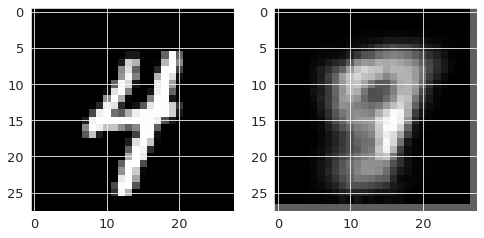

Epoch 2 of 10


100%|██████████| 47/47 [00:01<00:00, 46.27batch/s]


KL term loss: 4.696395737275894
Train Loss: 5603.2095
Val Loss: 4767.0543


100%|██████████| 79/79 [00:01<00:00, 46.49batch/s]


Test loss: 4430.02853521516


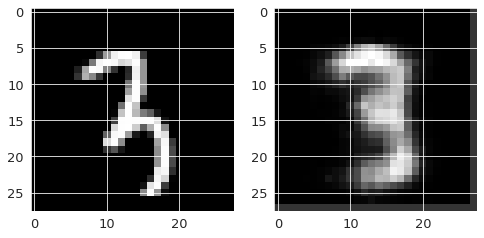

Epoch 3 of 10


100%|██████████| 47/47 [00:01<00:00, 43.06batch/s]


KL term loss: 7.6081389719997645
Train Loss: 4456.0346
Val Loss: 4134.5011


100%|██████████| 79/79 [00:01<00:00, 45.58batch/s]


Test loss: 3719.7535521350333


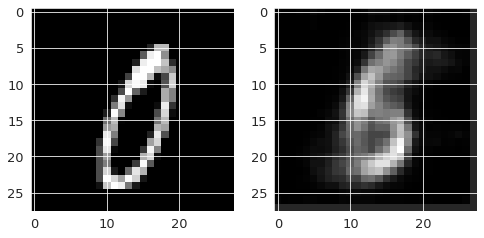

Epoch 4 of 10


100%|██████████| 47/47 [00:01<00:00, 46.22batch/s]


KL term loss: 8.648663265618689
Train Loss: 4037.5540
Val Loss: 3898.0141


100%|██████████| 79/79 [00:01<00:00, 46.16batch/s]


Test loss: 3460.328460162199


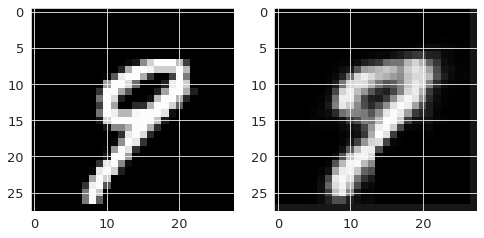

Epoch 5 of 10


100%|██████████| 47/47 [00:01<00:00, 44.26batch/s]


KL term loss: 9.84067853834075
Train Loss: 3800.1913
Val Loss: 3682.7878


100%|██████████| 79/79 [00:01<00:00, 47.96batch/s]


Test loss: 3162.8572260820415


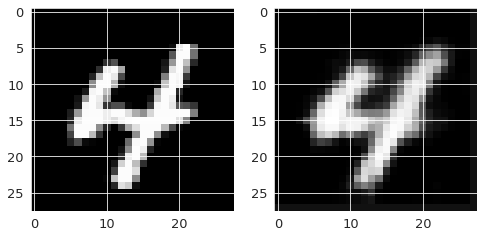

Epoch 6 of 10


100%|██████████| 47/47 [00:01<00:00, 43.52batch/s]


KL term loss: 10.290908538964766
Train Loss: 3659.6223
Val Loss: 3601.5737


100%|██████████| 79/79 [00:01<00:00, 47.18batch/s]


Test loss: 3065.1983583909046


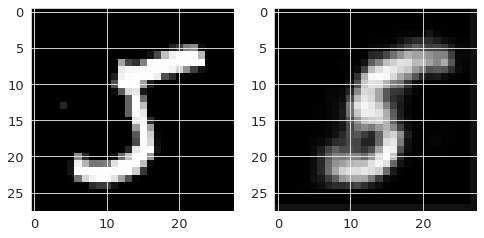

Epoch 7 of 10


100%|██████████| 47/47 [00:01<00:00, 46.49batch/s]


KL term loss: 10.452951656984114
Train Loss: 3585.0310
Val Loss: 3519.9742


100%|██████████| 79/79 [00:01<00:00, 49.00batch/s]


Test loss: 2973.3585213166252


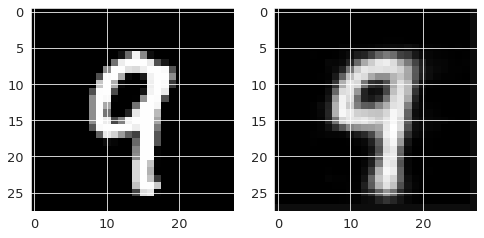

Epoch 8 of 10


100%|██████████| 47/47 [00:01<00:00, 45.90batch/s]


KL term loss: 10.590963965539993
Train Loss: 3539.6476
Val Loss: 3493.8894


100%|██████████| 79/79 [00:01<00:00, 46.19batch/s]


Test loss: 2960.7105114731608


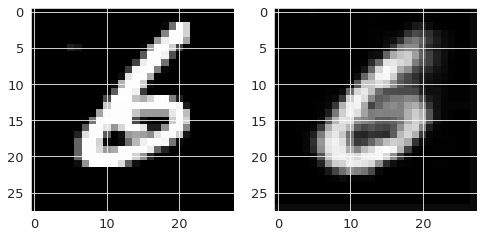

Epoch 9 of 10


100%|██████████| 47/47 [00:00<00:00, 47.13batch/s]


KL term loss: 10.651937360702547
Train Loss: 3498.2631
Val Loss: 3564.2243


100%|██████████| 79/79 [00:01<00:00, 45.78batch/s]


Test loss: 3032.6378547330446


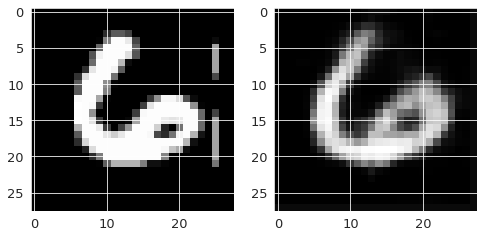

Epoch 10 of 10


100%|██████████| 47/47 [00:01<00:00, 42.62batch/s]


KL term loss: 10.754243425723079
Train Loss: 3469.4158
Val Loss: 3429.1281


100%|██████████| 79/79 [00:01<00:00, 47.40batch/s]


Test loss: 2907.5760461348523


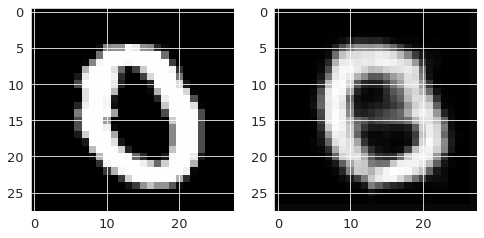

In [107]:
grid_images = []
train_kld_losses = []
train_recon_losses = []
test_kld_losses = []
test_recon_losses = []
coeff = beta
max_coeff = beta
coeffs = []
# <- You may wish to add logging info here
for epoch in range(num_epochs):  
    # <- You may wish to add logging info here
    print(f"Epoch {epoch+1} of {num_epochs}")
    coeffs.append(coeff)
    train_epoch_loss, data, kld_losses, recon_losses = train(model, optimizer, coeff)
    train_kld_losses.append(kld_losses)
    train_recon_losses.append(recon_losses)

    valid_epoch_loss, recon_images, data_val = validate(model, coeff)
    
    print(f"KL term loss: {kld_losses}")
    print(f"Train Loss: {train_epoch_loss:.4f}")
    print(f"Val Loss: {valid_epoch_loss:.4f}")
    
    kld_loss, recon_loss = test(model, coeff)
    test_kld_losses.append(kld_loss)
    test_recon_losses.append(recon_loss)
    
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8,15))
    original = data_val[0].cpu().squeeze().numpy()
    recon = recon_images[0].cpu().squeeze().numpy()

    axs[0].imshow(original, cmap='gray')
    axs[1].imshow(recon, cmap='gray')
    plt.pause(0.01)
    plt.clf
    #if epoch%5==0:
    #    coeff = 0
    #period = epoch%5
    #coeff = min(max_coeff, coeff+np.exp(period))

    # save the model
    if epoch == num_epochs - 1:
        with torch.no_grad():
            torch.jit.save(torch.jit.script(model), content_path/'CW_VAE/VAE_model.pth')
            #torch.jit.save(torch.jit.trace(model, (data), check_trace=False),
                #content_path/'CW_VAE/VAE_model.pth')
plt.show()

### Loss Explanation
Explain your choice of loss and how this relates to:

* The VAE Prior
* The output data domain
* Disentanglement in the latent space


In [ ]:
# Any code for your explanation here (you may not need to use this cell)

**YOUR ANSWER**

The following assumptions were made $$p_\theta(\textbf{x}|\textbf{z}) = \mathcal{N}(\textbf{x};G_\theta(\textbf{z});\sigma^2\textbf{I})$$
This says that the generated image follows a Gaussian distribution with a mean equal to a non linear transformation of the latent space representation. The covariance matrix is also diagonal to encourage a disentangled representation. This allows us to use the MSE loss when calculating the log likelihood term.

$$p_\theta(\textbf{z}) = \mathcal{N}(\textbf{z};\mathbf{0};\textbf{I})$$
The latent space representation follows a standard multivariate Gaussian distribution.

$$q_\phi(\textbf{z}|\textbf{x}) = \mathcal{N}(\textbf{z}; \mu_\phi(\textbf{x}); diag(\sigma^2_\phi(\textbf{x})))$$
This q distribution is designed to follow the the distribution of $p(z)$ as closely as possible. The mean and variance are calculated by a neural network.

$$p(\textbf{z}) = \prod_{i=1}^{d}p(z_i)$$
$$q_\phi(\textbf{z}|\textbf{x}) =: q(\textbf{z}) = \prod_{i=1}^{d}q(z_i)$$
The p and q distributions can be decomposed by their product since we assume that each dimension represents an independent (and disentangled) variable. This allows use to use the analytic expression of the KL divergence of 2 Gaussian distributions.

We would like to achieve learning of disentangled representations, i.e. changing the value of a dimension in the latent space will change a particular factor in the generated space.

<h2>Part 1.2 (9 points)</h2>

a. Plot your loss curves

b. Show reconstructions and samples

c. Discuss your results from parts (a) and (b)

## Part 1.2a: Loss Curves (3 Points)
Plot your loss curves (6 in total, 3 for the training set and 3 for the test set): total loss, reconstruction log likelihood loss, KL loss (x-axis: epochs, y-axis: loss). If you experimented with different values of $\beta$, you may wish to display multiple plots (worth 1 point).

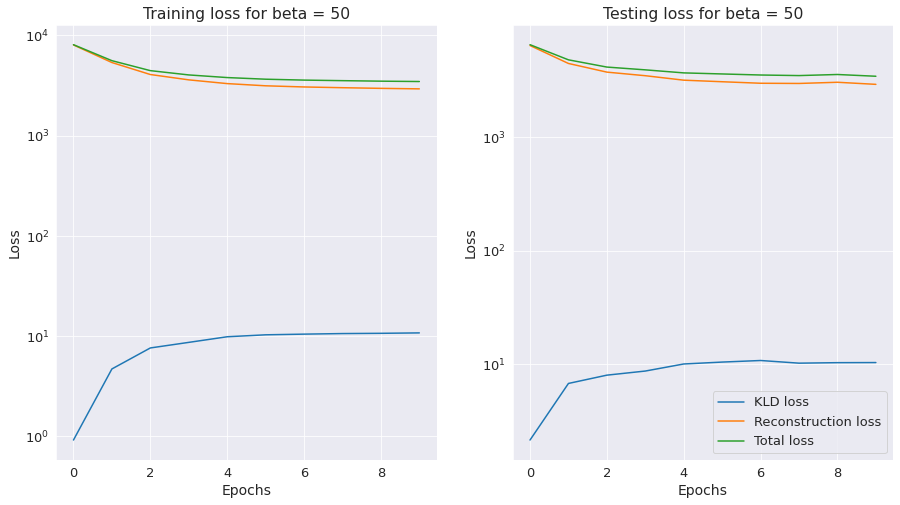

In [108]:
train_kld_losses = np.array(train_kld_losses)
train_recon_losses = np.array(train_recon_losses)
test_kld_losses = np.array(test_kld_losses)
test_recon_losses = np.array(test_recon_losses)
total_test_loss = beta*test_kld_losses + test_recon_losses
total_train_loss = beta*train_kld_losses + train_recon_losses
#print(train_recon_losses/train_kld_losses)

np.savetxt(f"CW_VAE/beta{beta}/train_kld_losses_beta{beta}", train_kld_losses)
np.savetxt(f"CW_VAE/beta{beta}/train_recon_losses_beta{beta}", train_recon_losses)
np.savetxt(f"CW_VAE/beta{beta}/train_total_loss_beta{beta}", total_train_loss)
np.savetxt(f"CW_VAE/beta{beta}/test_kld_losses_beta{beta}", test_kld_losses)
np.savetxt(f"CW_VAE/beta{beta}/test_recon_losses_beta{beta}", test_recon_losses)
np.savetxt(f"CW_VAE/beta{beta}/test_total_loss_beta{beta}", total_test_loss)

fig, axs = plt.subplots(1,2,figsize=(15,8))
axs[0].plot(train_kld_losses, label='KLD loss')
axs[0].plot(train_recon_losses, label='Reconstruction loss')
axs[0].plot(total_train_loss, label='Total loss')
#axs[0].plot(coeffs, label='beta')
axs[0].set_xlabel('Epochs')
axs[0].set_ylabel('Loss')
axs[0].set_yscale('log')
axs[0].set_title(f'Training loss for beta = {coeff}')

axs[1].plot(test_kld_losses, label='KLD loss')
axs[1].plot(test_recon_losses, label='Reconstruction loss')
axs[1].plot(total_test_loss, label='Total loss')
#axs[1].plot(coeffs, label='beta')
axs[1].set_xlabel('Epochs')
axs[1].set_ylabel('Loss')
axs[1].set_yscale('log')
axs[1].set_title(f'Testing loss for beta = {coeff}')

#plt.savefig("kl_annealing.png", dpi=200)
plt.legend()
plt.show()

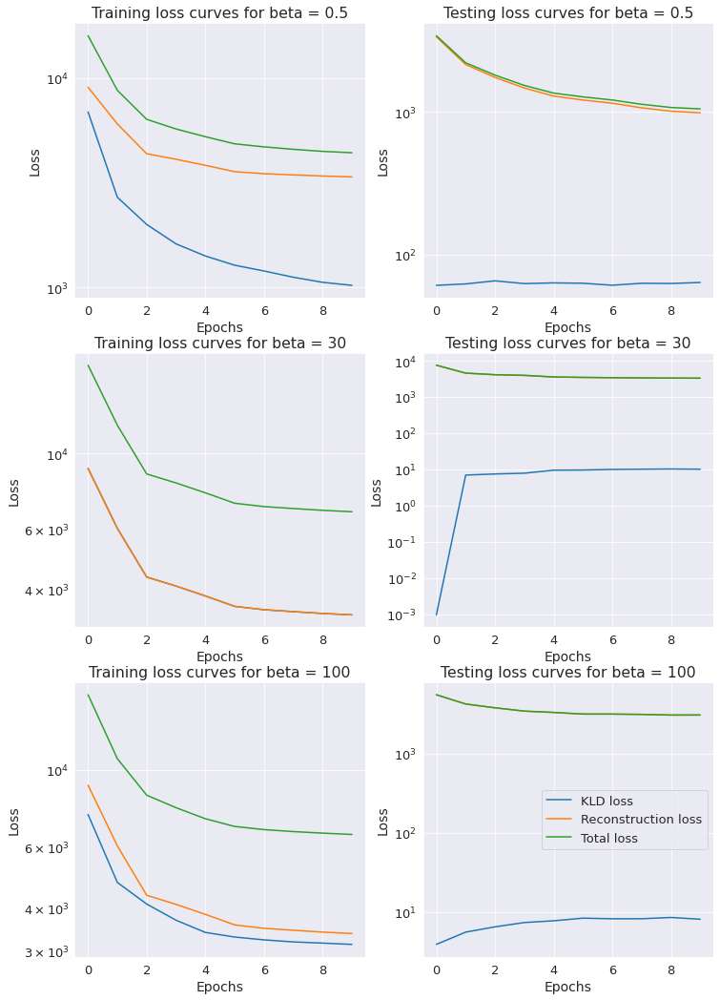

In [90]:
betas = [0.5, 30, 100]
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(12,18))

for i, b in enumerate(betas):
    train_kld_losses = np.loadtxt(f"CW_VAE/beta{b}/train_kld_losses_beta{b}")
    train_kld_losses = np.loadtxt(f"CW_VAE/beta{b}/train_recon_losses_beta{b}")
    total_train_loss = train_kld_losses + train_recon_losses
    axs[i,0].plot(train_kld_losses, label='KLD loss')
    axs[i,0].plot(train_recon_losses, label='Reconstruction loss')
    axs[i,0].plot(total_train_loss, label='Total loss')
    axs[i,0].set_xlabel('Epochs')
    axs[i,0].set_ylabel('Loss')
    axs[i,0].set_yscale('log')
    
    axs[i,0].set_title(f"Training loss curves for beta = {b}")
    
    test_kld_losses = np.loadtxt(f"CW_VAE/beta{b}/test_kld_losses_beta{b}")
    test_recon_losses = np.loadtxt(f"CW_VAE/beta{b}/test_recon_losses_beta{b}")
    total_test_loss = test_kld_losses + test_recon_losses
    axs[i,1].plot(test_kld_losses, label='KLD loss')
    axs[i,1].plot(test_recon_losses, label='Reconstruction loss')
    axs[i,1].plot(total_test_loss, label='Total loss')
    axs[i,1].set_xlabel('Epochs')
    axs[i,1].set_ylabel('Loss')
    axs[i,1].set_yscale('log')
    
    axs[i,1].set_title(f"Testing loss curves for beta = {b}")

plt.legend()
plt.show()


## Part 1.2b: Samples and Reconstructions (6 Points)
Visualize a subset of the images of the test set and their reconstructions **as well as** a few generated samples. Most of the code for this part is provided. You only need to call the forward pass of the model for the given inputs (might vary depending on your implementation).

For reference, here's [some samples from our VAE](https://imgur.com/NwNMuG3).


Input images
--------------------------------------------------
Reconstructed images
--------------------------------------------------
Generated Images
--------------------------------------------------
50


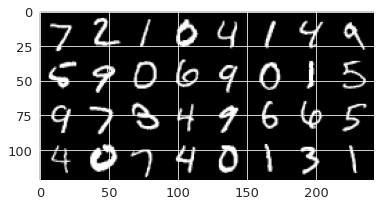

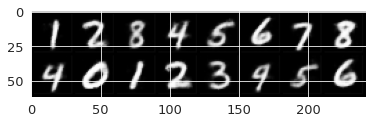

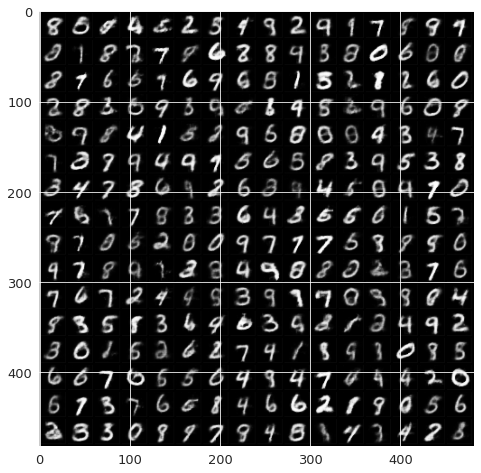

In [109]:
# *CODE FOR PART 1.2b IN THIS CELL*

# load the model
print('Input images')
print('-'*50)

#model = torch.jit.load("CW_VAE/VAE_model.pth")

sample_inputs, _ = next(iter(loader_test))
fixed_input = sample_inputs[0:32, :, :, :]
# visualize the original images of the last batch of the test set
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
show(img)

print('Reconstructed images')
print('-'*50)
model.eval()
with torch.no_grad():
    # visualize the reconstructed images of the last batch of test set
    
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    for data, _ in loader_test:
        batched = data
    batched = batched.to(device)
    recon_batch, _, _ = model(batched)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    recon_batch = recon_batch.cpu()
    recon_batch = make_grid(denorm(recon_batch), nrow=8, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure()
    show(recon_batch)

print('Generated Images')  
print('-'*50)
model.eval()
n_samples = 256
torch.manual_seed(3078)
z = torch.randn(n_samples,latent_dim).to(device)
with torch.no_grad():
    #######################################################################
    #                       ** START OF YOUR CODE **
    #######################################################################
    z = model.fc2(z) 
    z = z.view(-1, 64, 1, 1)
    #print(z.size())
    samples = model.decode(z)
    #######################################################################
    #                       ** END OF YOUR CODE **
    ####################################################################### 
    
    samples = samples.cpu()
    samples = make_grid(denorm(samples), nrow=16, padding=2, normalize=False,
                            range=None, scale_each=False, pad_value=0)
    plt.figure(figsize = (8,8))
    show(samples)

print(beta)


### Discussion
Provide a brief analysis of your loss curves and reconstructions: 
* What do you observe in the behaviour of the log-likelihood loss and the KL loss (increasing/decreasing)?
* Can you intuitively explain if this behaviour is desirable? 
* What is posterior collapse and did you observe it during training (i.e. when the KL is too small during the early stages of training)? 
    * If yes, how did you mitigate it? How did this phenomenon reflect on your output samples?
    * If no, why do you think that is?

**YOUR ANSWER**

For values $0.5 < \beta < 20$, the generated images resemble distinct shapes but are difficult to interpret as handwritten digits, however the reconstructed images are of good quality.

For $20 < \beta < 75$ both the reconstrsucted and generated images are of good quality and handwritten digits are generally very easily recognised. The best beta value was found to be 50.

For higher values of beta, there is some evidence of posterior collapse as the images from reconstruction and generation begin to look uniform. 

The loss curves show that the reconstruction loss forms the overwhelming majority of the total loss.
The reconstructions are mostly accurate but the 4 is often reconstructed as a 9 due to their similarity in features.

From the loss curves it can be seen that the log likelihood loss decreases over the epochs while the KL loss increases. The reconstruction loss decreases as the VAE begins to output more accurate reconstructions and the KL term increases as the more information is encoded into the posterior $q_\phi(z|x)$ than is present in the prior $p(z)$. This is desirable as it shows that the model is learning the latent representations well. Initially the KL loss starts very low since the posterior has not encoded any more information than the prior.

Posterior collapse refers to the phenomenon where the signal from the input x to the posterior parameters does not carry meaningful information and the decoder ignores the conditional dependence, i.e. $q_\phi(z|x) \approx q_\phi(z) = \mathcal{N}(\textbf{z};\mathbf{0}; \textbf{I})$
Ways to mitigiate this including the annealing of the KL term is explored in this paper https://arxiv.org/pdf/1511.06349.pdf.

Interestingly posterior collapse was observed particularly when using the mean reduction for the log likelihood term in the loss function. In this case the KL term was found to frequently vanish and cause generated and reconstructed images to be uniform. In order to mitigate this, a KL annealing schedule was introduced. Initially a monotonic schedule was tried but failed to produce satisfactory results. Then a cyclic annealing schedule was implemented inspired by this paper https://arxiv.org/pdf/1903.10145.pdf. This schedule produced slightly more optimistic values for the KL loss term but still continued to vanish. Thus the sum reduction was used within the loss function, this may allow better gradient flow due to the increased magnitude of the loss term. Other reasons for posterior collapse include the case where $\sigma$ for the posterior $p(x|z)$ is too large or the number of latent dimensions is too excessive. This particular model only used 16 dimensions for the latent space and $\sigma=0.5$

A figure for the KL annealing loss curves can be found in "kl_annealing.png"


---
<h2> Part 1.3 (11 points) <h2/>

Qualitative analysis of the learned representations

In this question you are asked to qualitatively assess the representations that your model has learned. In particular:

a. Dimensionality Reduction of learned embeddings

b. Interpolating in the latent space

## Part 1.3a: T-SNE on Embeddings (7 Points)
Extract the latent representations of the test set and visualize them using [T-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding)  [(see implementation)](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html). You can use a T-SNE implementation from a library such as scikit-learn. 

We've provided a function to visualize a subset of the data, but you are encouraged to also produce a matplotlib plot (please use different colours for each digit class).

In [14]:
# *CODE FOR PART 1.3a IN THIS CELL
from sklearn.manifold import TSNE

In [37]:
# Interactive Visualization - Code Provided
test_dataloader = DataLoader(test_dat, 10000, shuffle=False)
""" Inputs to the function are
        z_embedded - Embedded X, Y positions for every point in test_dataloader
        test_dataloader - dataloader with batchsize set to 10000
        num_points - number of points plotted (will slow down with >1k)
"""
model = torch.jit.load(content_path/'CW_VAE/VAE_model.pth')
model.eval()
decoded = torch.zeros(1, latent_dim, device=device)
targets = torch.zeros(1)
for (data,labels) in test_dataloader:
    with torch.no_grad():
        data = data.to(device)
        mu, logvar = model.encode(data)
        z = model.reparametrize(mu, logvar)
        decoded = torch.cat((decoded, z), 0)
        targets = torch.cat((targets, labels))
    
decoded = decoded[1:,:]
targets = targets[1:]
decoded = decoded.cpu().numpy()
targets = targets.cpu().numpy()
#print(decoded)
z_embedded = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=5).fit_transform(decoded)
    
plot_tsne(z_embedded, test_dataloader, num_points=1000, darkmode=False)


alt.HConcatChart(...)

In [29]:
# Custom Visualizations
z_embedded_perp2 = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=2).fit_transform(decoded)
#np.savetxt(f"beta_{beta}_perp2", z_embedded_perp2)
z_embedded_perp5 = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=5).fit_transform(decoded)
#np.savetxt(f"beta_{beta}_perp5", z_embedded_perp5)
z_embedded_perp100 = TSNE(n_components=2, learning_rate='auto', init='random', perplexity=100).fit_transform(decoded)
#np.savetxt(f"beta_{beta}_perp100", z_embedded_perp100)

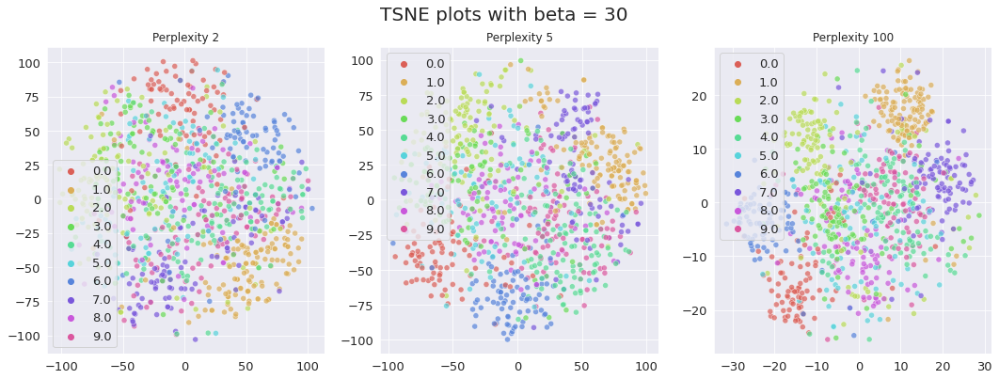

In [30]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(18, 6))
perps = [2, 5, 100]
data = [z_embedded_perp2, z_embedded_perp5, z_embedded_perp100]

for i, z_embedded in enumerate(data):
    xs = z_embedded[:1000,0]
    ys = z_embedded[:1000,1]
    labels = targets[:1000]

    sns.scatterplot(
        x=xs, y=ys,
        hue=labels,
        palette=sns.color_palette("hls", 10),
        legend="full",
        alpha=0.7,
        ax=axs[i]
    )
    axs[i].set_title(f"Perplexity {perps[i]}")
    #axs[i].axis('off')

fig.suptitle(f"TSNE plots with beta = {beta}", fontsize=20)
#plt.savefig(f"CW_VAE/TSNE_beta{beta}.png")
plt.show()

### Discussion
What do you observe? Discuss the structure of the visualized representations. 
* What do you observe? What role do the KL loss term and $\beta$ have, if any, in what you observe (multiple matplotlib plots may be desirable here)?
    * Consider Outliers
    * Counsider Boundaries
    * Consider Clusters
* Is T-SNE reliable? What happens if you change the parameters (don't worry about being particularly thorough). [This link](https://distill.pub/2016/misread-tsne/) may be helpful.

Note - If you created multiple plots and want to include them in your discussion, the best option is to upload them to (e.g.) google drive and then embed them via a **public** share link. If you reference local files, please include these in your submission zip, and use relative pathing if you are embedding them (with the notebook in the base directory)

**YOUR ANSWER**

ALL PLOTS IN "./TSNE_beta*.png"

A lower value of $\beta$ produces more clearly defined groups within the TSNE plot, whereas higher values of $\beta$ cause more mixing (within the 2D space). This is because the model focuses less on the reconstruction and more on matching the posterior $q_\phi(z|x)$ with the prior on the latent space $p(z)$.
Using higher perplexity causes more separations between the clusters particularly noticeable in the case for $\beta=1$. The perplexity loosely refers to the number of close neighbours each point has. 

Digits with similar shapes and patterns are clustered closely like 3 and 8. However there are outliers such as the digit 9 which is clustered within the group of 1s. This may be considered reasonable if the circle of the 9 was particularly small. Similarly there were 8s in the group of 3s, presumably where the 8 was not drawn fully connected. The boundaries between the clusters are clearly defined only in the case of $\beta=1$. In all other cases shown in the figures, each cluster is overlapped by other clusters.

Interestingly, the cluster of 5s is very widely distributed across the 2D space with no clear boundary (in the case of $\beta=30$ and $\beta=100$). 

TSNE is not very reliable as the results can vary drastically depending on the hyperparameters used. The distance between the clusters may not be representative of the true separation distance in the latent space. Similarly the sizes of the clusters cannot be interpreted meaningfully.

## Part 1.3b: Interpolating in $z$ (4 Points)
Perform a linear interpolation in the latent space of the autoencoder by choosing any two digits from the test set. What do you observe regarding the transition from on digit to the other?

_hint: Locate the positions in latent space of 2 data points (maybe a one and an eight). Then sample multiple latent space vectors along the line which joins the 2 points and pass them through the decoder._


In [92]:
# CODE FOR PART 1.3b IN THIS CELL
class SortData(Dataset):
    def __init__(self, dataset, x, transform=None):    
        targets = dataset.targets    
        self.desired_idxs = (targets == x).nonzero()
        self.dataset = dataset
        self.transform = transform

    def __len__(self):
        return len(self.desired_idxs)

    def __getitem__(self, idx):
        true_idx = self.desired_idxs[idx]
        data = self.dataset.data[true_idx]
        data = data / 255.0
        label = self.dataset.targets[true_idx]
        if self.transform:
            data = self.transform(data)

        return (data, label)

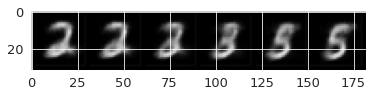

In [93]:
set1 = SortData(test_dat, 2)
set2 = SortData(test_dat, 5)

custom_loader1 = DataLoader(set1, 64, shuffle=False)
custom_loader2 = DataLoader(set2, 64, shuffle=False)

z1 = torch.zeros(1,latent_dim)
z2 = torch.zeros(1,latent_dim)

model = model.to(device)
model.eval()

with torch.no_grad():

    for (data, _) in custom_loader1:
        data = data.to(device)
        mu, logvar = model.encode(data)
        z_reparam = model.reparametrize(mu, logvar)
        z_reparam = z_reparam.cpu()
        z1 = torch.cat((z1, z_reparam), dim=0)

    for (data, _) in custom_loader2:
        data = data.to(device)
        mu, logvar = model.encode(data)
        z_reparam = model.reparametrize(mu, logvar)
        z_reparam = z_reparam.cpu()
        #print(z_reparam)
        z2 = torch.cat((z2, z_reparam), dim=0)

z1 = z1[1:,:]
z2 = z2[1:,:]

z1_mean = torch.mean(z1, dim=0)
z2_mean = torch.mean(z2, dim=0)
diff = z2_mean - z1_mean
interpolates = torch.zeros(1,latent_dim)
interpolates = interpolates.to(device)
for i in range(6):
    z = z1_mean + i*diff/6
    z = z.unsqueeze(0)
    z = z.to(device)
    interpolates = torch.cat((interpolates, z), dim=0)

interpolates = interpolates[1:]


zs = model.fc2(interpolates)
zs = zs.view(-1,64,1,1)
samples = model.decode(zs)

img = make_grid(denorm(samples), nrow=6, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
show(img)

### Discussion
What did you observe in the interpolation? Is this what you expected?
* Can you relate the interpolation to your T-SNE visualization

**YOUR ANSWER**

This visualisation shows that a 2 travels to 5 in the latent space via the representation of 3. This is in accordance with the TSNE plots (noticeably in $\beta=1$). The change in the latent vector representation is constant, and the change in the image generation appears to be similar (by eye) which could be a result of a good disentangled representation.

# Part 2 - Deep Convolutional GAN

In this task, your main objective is to train a DCGAN (https://arxiv.org/abs/1511.06434) on the CIFAR-10 dataset. You should experiment with different architectures and tricks for stability in training (such as using different activation functions, batch normalization, different values for the hyper-parameters, etc.). In the end, you should provide us with: 

- your best trained model (which we will be able to load and run), 
- some generations for the fixed latent vectors $\mathbf{z}\sim \mathcal{N}\left(\mathbf{0}, \mathbf{I}\right)$ we have provided you with (train for a number of epochs and make sure there is no mode collapse), 
- plots with the losses for the discriminator $D$ and the generator $G$ as the training progresses and explain whether your produced plots are theoretically sensible and why this is (or not) the case. 
- a discussion on whether you noticed any mode collapse, where this behaviour may be attributed to, and explanations of what you did in order to cope with mode collapse. 

## Part 2.1 (30 points)
**Your Task**: 

a. Implement the DCGAN architecture. 

b. Define a loss and implement the Training Loop

c. Visualize images sampled from your best model's generator ("Extension" Assessed on quality)

d. Discuss the experimentations which led to your final architecture. You can plot losses or generated results by other architectures that you tested to back your arguments (but this is not necessary to get full marks).


_Clarification: You should not be worrying too much about getting an "optimal" performance on your trained GAN. We want you to demonstrate to us that you experimented with different types of DCGAN variations, report what difficulties transpired throughout the training process, etc. In other words, if we see that you provided us with a running implementation, that you detail different experimentations that you did before providing us with your best one, and that you have grapsed the concepts, you can still get good marks. The attached model does not have to be perfect, and the extension marks for performance are only worth 10 points._

In [8]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.utils.data import sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
from torch.optim.lr_scheduler import StepLR, MultiStepLR
from torch.autograd import Variable
from torch.nn.utils.parametrizations import spectral_norm
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torch.autograd as autograd
import copy

#mean = torch.Tensor([0.4914, 0.4822, 0.4465])
#std = torch.Tensor([0.247, 0.243, 0.261])
mean = torch.Tensor([0.5, 0.5, 0.5])
std = torch.Tensor([0.5, 0.5, 0.5])

unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

def show(img):
    npimg = img.cpu().numpy()
    plt.imshow(np.transpose(npimg, (1,2,0)))

if not os.path.exists(content_path/'CW_GAN'):
    os.makedirs(content_path/'CW_GAN')
    
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
GPU = True # Choose whether to use GPU
if GPU:
    device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")
else:
    device = torch.device("cpu")
print(f'Using {device}')

# We set a random seed to ensure that your results are reproducible.
if torch.cuda.is_available():
    torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

Using cuda


### Part 2.1a: Implement DCGAN (8 Points)
Fill in the missing parts in the cells below in order to complete the Generator and Discriminator classes. You will need to define:

- The hyperparameters
- The constructors
- `decode`
- `discriminator`

Recomendations for experimentation:
- use the architecture that you implemented for the Autoencoder of Part 1 (encoder as discriminator, decoder as generator).
- use the architecture desribed in the DCGAN paper (https://arxiv.org/abs/1511.06434).

Some general reccomendations:
- add several convolutional layers (3-4).
- accelerate training with batch normalization after every convolutional layer.
- use the appropriate activation functions. 
- Generator module: the upsampling can be done with various methods, such as nearest neighbor upsampling (`torch.nn.Upsample`) or transposed convolutions(`torch.nn.ConvTranspose2d`). 
- Discriminator module: Experiment with batch normalization (`torch.nn.BatchNorm2d`) and leaky relu (`torch.nn.LeakyReLu`) units after each convolutional layer.

Try to follow the common practices for CNNs (e.g small kernels, max pooling, RELU activations), in order to narrow down your possible choices.

<font color="red">**Your model should not have more than 25 Million Parameters**</font>

The number of epochs that will be needed in order to train the network will vary depending on your choices. As an advice, we recommend that while experimenting you should allow around 20 epochs and if the loss doesn't sufficiently drop, restart the training with a more powerful architecture. You don't need to train the network to an extreme if you don't have the time.

#### Data loading

In [9]:
batch_size = 64 # change that
#RESIZED TO 64 X 64
transform = transforms.Compose([
     transforms.Resize(64),
     transforms.ToTensor(),
     transforms.Normalize(mean=mean, std=std)
])
# note - data_path was initialized at the top of the notebook
cifar10_train = datasets.CIFAR10(data_path, train=True, download=True, transform=transform)
cifar10_test = datasets.CIFAR10(data_path, train=False, download=True, transform=transform)
loader_train = DataLoader(cifar10_train, batch_size=batch_size)
loader_test = DataLoader(cifar10_test, batch_size=batch_size)

Files already downloaded and verified
Files already downloaded and verified


We'll visualize a subset of the test set: 

torch.Size([3, 64, 64])


/usr/local/lib/python3.9/dist-packages/torchvision/utils.py:68: UserWarning: The parameter 'range' is deprecated since 0.12 and will be removed in 0.14. Please use 'value_range' instead.
  warnings.warn(


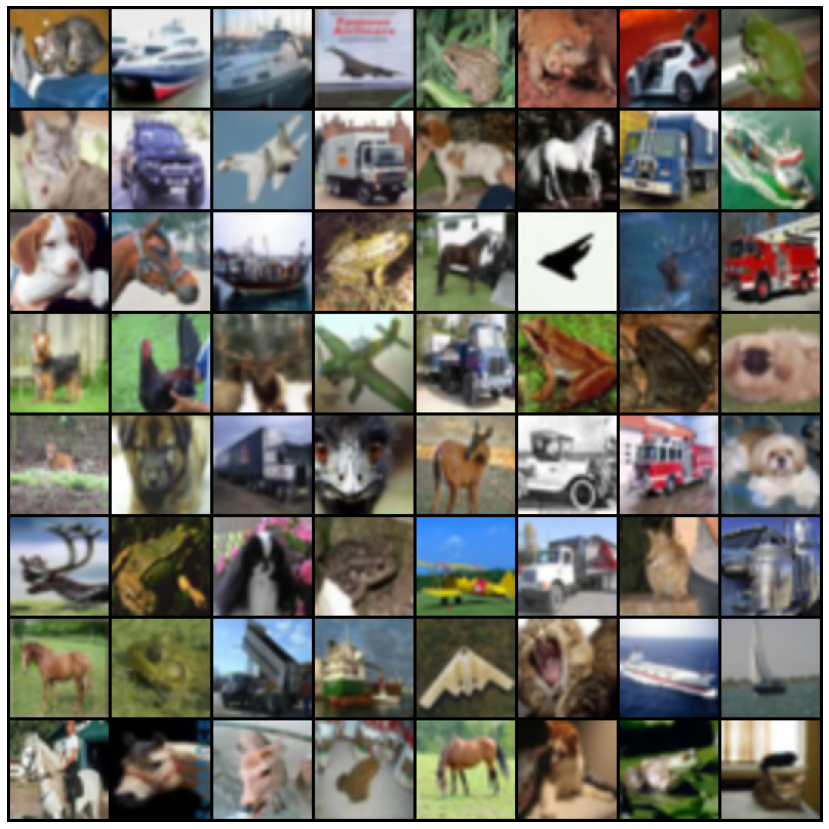

In [40]:
samples, _ = next(iter(loader_test))

samples = samples.cpu()
print(samples[0].size())
samples = make_grid(denorm(samples), nrow=8, padding=2, normalize=False,
                        range=None, scale_each=False, pad_value=0)
plt.figure(figsize = (15,15))
plt.axis('off')
show(samples)

#### Model Definition
Define hyperparameters and the model

In [19]:
# *CODE FOR PART 2.1 IN THIS CELL*

# Choose the number of epochs, the learning rate
# and the size of the Generator's input noise vetor.

num_epochs = 300
learning_rate = 2e-4
latent_vector_size = 128

# Other hyperparams
#d_loop = 3
#lambda_gp = 10
unrolled_steps = 3
g_steps = 1
d_steps = 3

In [20]:
# *CODE FOR PART 2.1 IN THIS CELL*

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        ngf = 64
        og_size = 32
        
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(latent_vector_size, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False)
        )

        
        
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 

    # You can modify the arguments of this function if needed
    def forward(self, z):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        
        out = self.main(z)
        
        #######################################################################
        #                       ** END OF YOUR CODE **
        #######################################################################
        return out


class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################
        ndf = 64
        og_size = 32

        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(3, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
        
    def load(self, backup):
        for m_from, m_to in zip(backup.modules(), self.modules()):
            if isinstance(m_to, nn.Conv2d):
                m_to.weight.data = m_from.weight.data.clone()
            if isinstance(m_to, nn.BatchNorm2d):
                m_to.weight.data = m_from.weight.data.clone()
                if m_to.bias is not None:
                    m_to.bias.data = m_from.bias.data.clone()  
    
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
    # You can modify the arguments of this function if needed
    def forward(self, x):
        #######################################################################
        #                       ** START OF YOUR CODE **
        #######################################################################

        out = self.main(x)
        out = out.view(-1, 1).squeeze(1)
        #######################################################################
        #                       ** END OF YOUR CODE **
        ####################################################################### 
        
        return out


<h2> Initialize Model and print number of parameters </h2>

You can use method `weights_init` to initialize the weights of the Generator and Discriminator networks. Otherwise, implement your own initialization, or do not use at all. You will not be penalized for not using initialization.

In [21]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        #m.weight.data.xavier_uniform_(gain=2.0) 
        nn.init.xavier_uniform_(m.weight, gain=2.0) # glorot init
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [22]:
use_weights_init = True

model_G = Generator().to(device)
if use_weights_init:
    model_G.apply(weights_init)
params_G = sum(p.numel() for p in model_G.parameters() if p.requires_grad)
print("Total number of parameters in Generator is: {}".format(params_G))
print(model_G)
print('\n')

model_D = Discriminator().to(device)
if use_weights_init:
    model_D.apply(weights_init)
params_D = sum(p.numel() for p in model_D.parameters() if p.requires_grad)
print("Total number of parameters in Discriminator is: {}".format(params_D))
print(model_D)
print('\n')

print("Total number of parameters is: {}".format(params_G + params_D))

Total number of parameters in Generator is: 3806080
Generator(
  (main): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2),

### Part 2.1b: Training the Model (12 Points)

#### Defining a Loss

In [23]:
# You can modify the arguments of this function if needed

def loss_function(pred, target):
    criterion = nn.BCELoss()
    loss = criterion(pred, target)
    return loss

def compute_gradient_penalty(D, real_samples, fake_samples):
    """Calculates the gradient penalty loss for WGAN GP"""
    # Random weight term for interpolation between real and fake samples
    alpha = torch.rand(real_samples.size(0), 1, 1, 1, device=device)
    # Get random interpolation between real and fake samples
    interpolates = (alpha * real_samples + ((1 - alpha) * fake_samples)).requires_grad_(True)
    interpolates = interpolates.to(device)
    #print(interpolates.size())
    d_interpolates = D(interpolates)
    fake = Variable(torch.Tensor(real_samples.shape[0], 1).fill_(1.0), requires_grad=False)
    fake = fake.to(device)
    # Get gradient w.r.t. interpolates
    gradients = autograd.grad(
        outputs=d_interpolates,
        inputs=interpolates,
        grad_outputs=fake,
        create_graph=True,
        retain_graph=True,
        only_inputs=True,
    )[0]
    gradients = gradients.view(gradients.size(0), -1)
    gradient_penalty = ((gradients.norm(2, dim=1) - 1) ** 2).mean()
    gradient_penalty = gradient_penalty.to(device)
    return gradient_penalty

<h3>Choose and initialize optimizers</h3>

In [24]:
# setup optimizer
# You are free to add a scheduler or change the optimizer if you want. We chose one for you for simplicity.
beta1 = 0.5
optimizerD = torch.optim.Adam(model_D.parameters(), lr=learning_rate*2, betas=(beta1, 0.999))
optimizerG = torch.optim.Adam(model_G.parameters(), lr=learning_rate, betas=(beta1, 0.999))

#schedulerD = StepLR(optimizerD, step_size=10, gamma=0.99)
#schedulerG = StepLR(optimizerG, step_size=10, gamma=0.99)


<h3> Define fixed input vectors to monitor training and mode collapse. </h3>

In [25]:
torch.manual_seed(37)
fixed_noise = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
#fixed_noise = fixed_noise.squeeze(-1).squeeze(-1)
# Additional input variables should be defined here
real_label = 1.
fake_label = 0.

#### Training Loop

Complete the training loop below. We've defined some variables to keep track of things during training:
* errD: Loss of Discriminator after being trained on real and fake instances
* errG: Loss of Generator
* D_x: Output of Discriminator for real images
* D_G_z1: Output of Discriminator for fake images (When Generator is not being trained)
* D_G_z2: Output of Discriminator for fake images (When Generator is being trained)

## Unrolled GAN

In [26]:
def d_loop():
    # 1. Train D on real+fake
    optimizerD.zero_grad()

    #  1A: Train D on real
    d_real_data = data[0].to(device)
    d_real_decision = model_D(d_real_data)
    D_x = d_real_decision.cpu().detach().numpy()
    #Label smoothing one sided
    #target = torch.ones_like(d_real_decision, device=device)
    target = torch.ones_like(d_real_decision)*0.8 + torch.rand_like(d_real_decision)*0.2
    target = target.to(device)
    d_real_error = loss_function(d_real_decision, target)  # ones = true

    #  1B: Train D on fake
    d_gen_input = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
        
    with torch.no_grad():
        d_fake_data = model_G(d_gen_input)
    d_fake_decision = model_D(d_fake_data)
    D_g_z1 = d_fake_decision.cpu().detach().numpy()

    target = torch.zeros_like(d_fake_decision, device=device)
 
    d_fake_error = loss_function(d_fake_decision, target)  # zeros = fake
    
    d_loss = d_real_error + d_fake_error
    d_loss.backward()
    optimizerD.step()     # Only optimizes D's parameters; changes based on stored gradients from backward()
    return d_real_error.cpu().item(), d_fake_error.cpu().item(), np.mean(D_x), np.mean(D_g_z1)

def d_unrolled_loop(d_gen_input=None):
    # 1. Train D on real+fake
    optimizerD.zero_grad()

    #  1A: Train D on real
    d_real_data = data[0].to(device)
    d_real_decision = model_D(d_real_data)
    target = torch.ones_like(d_real_decision, device=device)
    d_real_error = loss_function(d_real_decision, target)  # ones = true

    #  1B: Train D on fake
    if d_gen_input is None:
        d_gen_input = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
    
    with torch.no_grad():
        d_fake_data = model_G(d_gen_input)
    d_fake_decision = model_D(d_fake_data)
    target = torch.zeros_like(d_fake_decision, device=device)
    d_fake_error = loss_function(d_fake_decision, target)  # zeros = fake
    
    d_loss = d_real_error + d_fake_error
    d_loss.backward(create_graph=True)
    optimizerD.step()     # Only optimizes D's parameters; changes based on stored gradients from backward()
    return d_real_error.cpu().item(), d_fake_error.cpu().item()

def g_loop():
    # 2. Train G on D's response (but DO NOT train D on these labels)
    optimizerG.zero_grad()

    gen_input = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)
        
    if unrolled_steps > 0:
        backup = copy.deepcopy(model_D)
        for i in range(unrolled_steps):
            d_unrolled_loop(d_gen_input=gen_input)
    
    g_fake_data = model_G(gen_input)
    dg_fake_decision = model_D(g_fake_data)
    D_g_z2 = dg_fake_decision.cpu().detach().numpy()
    target = torch.ones_like(dg_fake_decision, device=device)

    g_error = loss_function(dg_fake_decision, target)  # we want to fool, so pretend it's all genuine
    errG = g_error
    g_error.backward()
    optimizerG.step()  # Only optimizes G's parameters
    
    if unrolled_steps > 0:
        model_D.load(backup)    
        del backup
    return g_error.cpu().item(), np.mean(D_g_z2)

def g_sample():
    with torch.no_grad():
        gen_input = torch.randn(batch_size, latent_vector_size, 1, 1, device=device)

        g_fake_data = model_G(gen_input)
        return g_fake_data.cpu().numpy()


## Unrolled GAN training loop

In [28]:
train_losses_G = []
train_losses_D = []

# <- You may wish to add logging info here
for epoch in range(num_epochs):
    # <- You may wish to add logging info here
    with tqdm.tqdm(loader_train, unit="batch") as tepoch: 
        for i, data in enumerate(tepoch):
            train_loss_D = 0
            train_loss_G = 0
            
            #######################################################################
            #                       ** START OF YOUR CODE **
            #######################################################################
            d_infos = []
            for d_index in range(d_steps):
                d_info = d_loop()
                d_infos.append(d_info)
            d_infos = np.mean(d_infos, 0)
            #print(d_infos)
            errD_real, errD_fake, D_x, D_G_z1 = list(d_infos)
            errD = errD_real + errD_fake
            train_loss_D += errD

            g_infos = []
            for g_index in range(g_steps):
                g_info = g_loop()
                g_infos.append(g_info)
            g_infos = np.mean(g_infos, 0)
            errG, D_G_z2 = list(g_infos)  
            train_loss_G += errG
        

            ####################################################################### 
            #                       ** END OF YOUR CODE **
            ####################################################################### 
            # Logging 
            if i % 50 == 0:
                tepoch.set_description(f"Epoch {epoch}")
                tepoch.set_postfix(D_G_z=f"{D_G_z1:.3f}/{D_G_z2:.3f}", D_x=D_x,
                                  Loss_D=errD, Loss_G=errG)
        #schedulerG.step()
        #schedulerD.step()

    if epoch == 0:
        save_image(denorm(data[0].cpu()).float(), content_path/'CW_GAN/real_samples.png')
    with torch.no_grad():
        fake = model_G(fixed_noise)
        fname = f"CW_GAN/fake_samples_epoch_{epoch:03d}.png"
        save_image(denorm(fake.cpu()).float(), content_path/fname)
    train_losses_D.append(train_loss_D / len(loader_train))
    train_losses_G.append(train_loss_G / len(loader_train))
    
    if epoch%10==0:
        # save  models 
        # if your discriminator/generator are conditional you'll want to change the inputs here
        torch.jit.save(torch.jit.trace(model_G, (fixed_noise)), content_path/'CW_GAN/GAN_G_model.pth')
        torch.jit.save(torch.jit.trace(model_D, (fake)), content_path/'CW_GAN/GAN_D_model.pth')

Epoch 299: 100%|██████████| 782/782 [04:20<00:00,  3.00batch/s, D_G_z=0.005/0.013, D_x=0.904, Loss_D=0.337, Loss_G=4.69]


## Part 2.1c: Results (10 Points)
This part is fairly open-ended, but not worth too much so do not go crazy. The table below shows examples of what are considered good samples. Level 3 and above will get you 10/10 points, level 2 will roughly get you 5/10 points and level 1 and below will get you 0/10 points.

<table><tr>
<td> 
  <p align="center" style="padding: 10px">
    <img alt="Forwarding" src="https://drive.google.com/uc?id=1wQ2f10-A1Vs7k0LMfBPPyYTsPlkBF9QE" width="%30">
    <br>
    <em style="color: grey">Level 1</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1wlDhX4hROET4s8Ndxn8nhj_0RLM2rnuG" width="%30">
    <br>
    <em style="color: grey">Level 2</em>
  </p> 
</td>
<td> 
  <p align="center">
    <img alt="Routing" src="https://drive.google.com/uc?id=1w9VrgfJLCRaTPhwoFVYdYhtCeaQmFHGb" width="%30">
    <br>
    <em style="color: grey">Level 3</em>
  </p> 
</td>
</tr></table>

### Generator samples

/usr/local/lib/python3.9/dist-packages/torchvision/utils.py:68: UserWarning: The parameter 'range' is deprecated since 0.12 and will be removed in 0.14. Please use 'value_range' instead.
  warnings.warn(
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


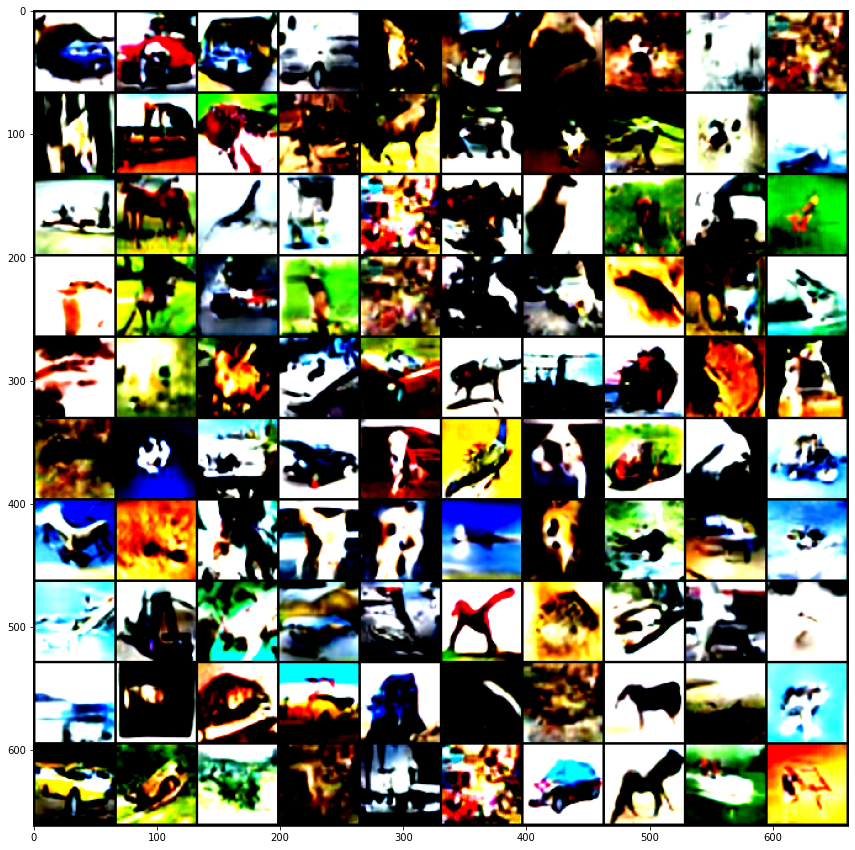

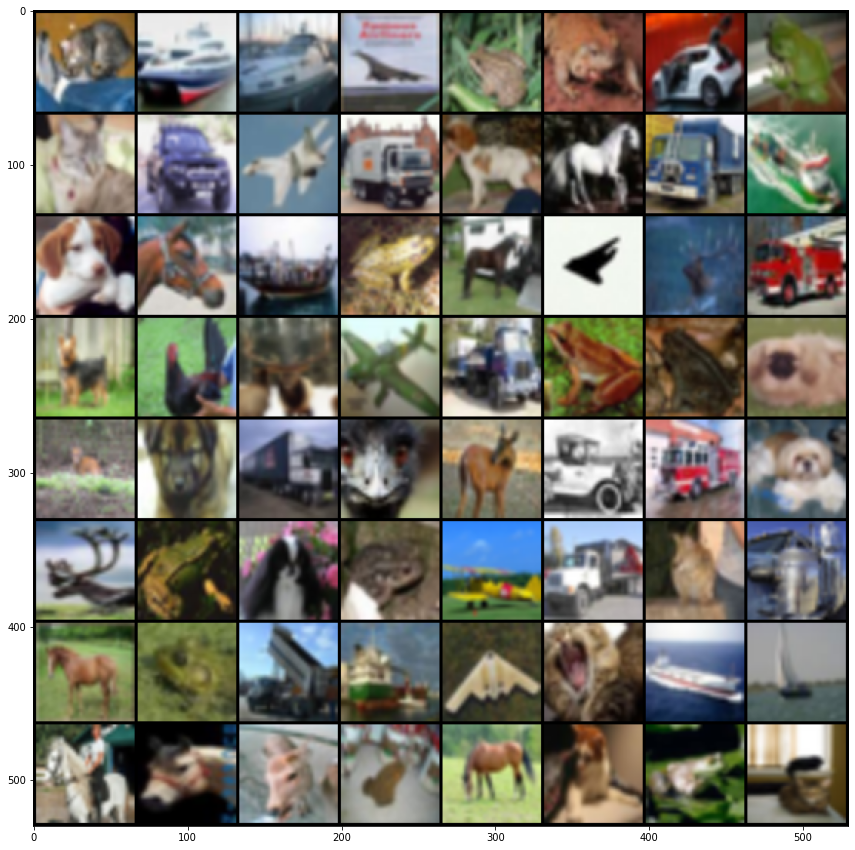

In [29]:
input_noise = torch.randn(100, latent_vector_size, 1, 1, device=device)
with torch.no_grad():
    # visualize the generated images
    generated = model_G(input_noise).cpu()
    generated = make_grid(denorm(generated)[:100], nrow=10, padding=2, normalize=False, 
                        range=None, scale_each=False, pad_value=0)
    plt.figure(figsize=(15,15))
    save_image(generated, content_path/'CW_GAN/Teaching_final.png')
    show(generated) # note these are now class conditional images columns rep classes 1-10

it = iter(loader_test)
sample_inputs, _ = next(it)
fixed_input = sample_inputs[0:64, :, :, :]
# visualize the original images of the last batch of the test set for comparison
img = make_grid(denorm(fixed_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
show(img)

## Part 2.1d: Engineering Choices (10 Points)

Discuss the process you took to arrive at your final architecture. This should include:

* Which empirically useful methods did you utilize
* What didn't work, what worked and what mattered most
* Are there any tricks you came across in the literature etc. which you suspect would be helpful here

**Your Answer**

* Leaky ReLU activation functions in discriminator to allow gradient flow and prevent dying neurons
* Using latent dimension of 128 is sufficient to mitigate mode collapse
* Using Conv2dTranspose gave better empirical results than using Upsample
* Resizing the images as a preprocessing step allows an extra convolution layer of stride 2
* Normalizing the images according to 0.5 in each channel gave better results than the true mean of standard deviation. This may be for a similar reason to the batchnorm where it is the equivalent of injecting noise into the model
* BatchNorm layers are used to stabilise the training - these were used in every layer of the discriminator and generator except the first and final one
* The weights of the network were initialised with the Glorot initialisation (https://proceedings.mlr.press/v9/glorot10a/glorot10a.pdf)
* One sided label smoothing is applied to reduce the chance of mode collapse and to compensate for the weak generator/strong discriminator
* Unrolling the GAN is the first solution that did result in mode collapse but does considerably slow down the training time
* Removed the activation on the final layer to prevent faded images
* Increased the update frequency of the discriminator relative to the generator in order to compensate for the unrolling 
* Increased the learning rate of the discriminator to compensate for the unrolling

Didn't work:

* A Wasserstein loss function with a gradient penalty and weight clipping was also attempted to prevent mode collapse but this method did not succeed
* A ResNet architecture was tried for both the discriminator and generator, however, the simpler convolutional layers without residual connections in this case worked better.
* Scheduling the learning rate for both the generator and discriminator were found to have a detrimental effect.

In conclusion, the most important aspect of the stability of the GAN training was the unrolling as well as the initial resizing of images as a preprocessing step as this allowed more powerful feature extraction. Unrolling the GAN made the generator vastly more powerful compared to not unrolling it, which prevented mode collapse. This is explained further in 2.3.

As the unrolled GAN prevented mode collapse, a further idea is left unexplored, namely the spectral norm. This approach normalizes the weights of the discriminator network according o the largest singular value of the weight matrix through a process of power iteration. It mitigates the exploding gradient problem by controlling the Lipschitz constant and also helps prevent mode collapse.


## Part 2.2: Understanding GAN Training (5 points)


### Loss Curves
**Your task:**


Plot the losses curves for the discriminator $D$ and the generator $G$ as the training progresses and explain whether the produced curves are theoretically sensible and why this is (or not) the case (x-axis: epochs, y-axis: loss).

Make sure that the version of the notebook you deliver includes these results.

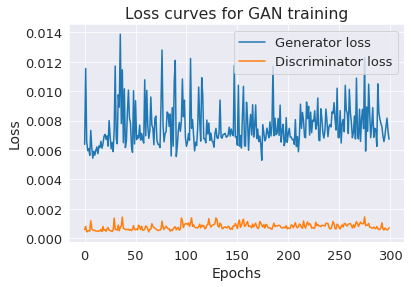

In [94]:
# ANSWER FOR PART 2.2 IN THIS CELL*
plt.plot(train_losses_G, label='Generator loss')
plt.plot(train_losses_D, label='Discriminator loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title("Loss curves for GAN training")
plt.legend()
plt.show()

### Discussion

Do your loss curves look sensible? What would you expect to see and why?

**YOUR ANSWER**

The loss curves should appear to converge on some loss value over time with some oscillatory movement to show the learning process. Usually an decrease in the generator loss results in a increase in the discriminator loss and vice versa. As the generator learns to produce more faithful images, the discriminator will guess incorrectly thus resulting in a greater loss.

The current loss curves show a very stable discriminator loss but a more rapidly fluctuating generator loss. This may be due to the fact that the discriminator is trained more often than the generator and this causes large differences between losses between the epochs despite the unrolling. Due to the difference in variations over the curves, the discriminator loss does not appear to respond to the generator loss on the same scale.

## Part 2.3: Understanding Mode Collapse (5 points) 
**Your task:**
 
Describe the what causes the phenomenon of Mode Collapse and how it may manifest in the samples from a GAN. 

Based on the images created by your generator using the `fixed_noise` vector during training, did you notice any mode collapse? what this behaviour may be attributed to, and what did you try to eliminate / reduce it?

In [ ]:
# Any additional code

### Discussion


**YOUR ANSWER**

Mode collapse occurs when the generator learns to generate a small sample of images which the discriminator cannot distinguish as real or fake, and the generator therefore continues to produce these same subset of images which is undesirable.

It may occur for a number of reasons:
* The number of latent space dimensions is too small
* There is an imbalanced generator and discriminator - unstable training
* Unsuitable loss function

In order to eliminate mode collapse, the unrolled GAN was used. Unrolling the GAN is where the generator looks ahead to see how the discriminator will update itself after k steps in the future, and updates itself accordingly. This technique also increases training stability and compensates for the frequent occurence of having an overly powerful discriminator. Note that this is different from updating the generator k times for every time the discriminator is updated as unrolling will calculate the parameters of the network k steps in the future **with respect to the current parameters**. 

This is made possible by the autograd package which allows the gradient updates to be computed along each of the k steps.
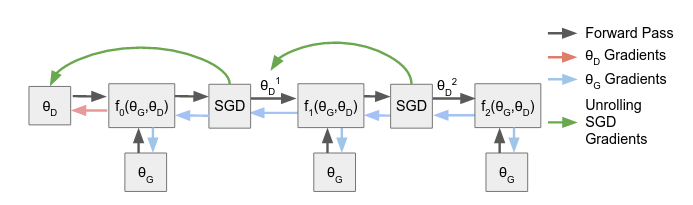

This is the computational graph for unrolling the GAN with k=3. This is explored in detail in this paper: https://arxiv.org/pdf/1611.02163.pdfwas.



# TA Test Cell
TAs will run this cell to ensure that your results are reproducible, and that your models have been defined suitably. 

<font color="orange"> <b> Please provide the input and output transformations required to make your VAE and GANs work. If your GAN generator requires more than just noise as input, also specify this below (there are two marked cells for you to inspect) </b></font>


In [98]:
# If you want to run these tests yourself, change directory:
# %cd '.../dl_cw2/'
ta_data_path = "data" # You can change this to = data_path when testing

In [ ]:
!pip install -q torch torchvision

In [95]:
# Do not remove anything here
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, sampler
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torch.nn.functional as F
import matplotlib.pyplot as plt 

show = lambda img: plt.imshow(np.transpose(img.cpu().numpy(), (1,2,0)))

device = torch.device("cuda"  if torch.cuda.is_available() else "cpu")

# Do not change this cell!
torch.backends.cudnn.deterministic = True
torch.manual_seed(0)

In [96]:
############# CHANGE THESE (COPY AND PASTE FROM YOUR OWN CODE) #############
vae_transform = transforms.Compose([
    transforms.ToTensor(),
])

def vae_denorm(x):
    return x

mean = torch.Tensor([0.5, 0.5, 0.5])
std = torch.Tensor([0.5, 0.5, 0.5])

unnormalize = transforms.Normalize((-mean / std).tolist(), (1.0 / std).tolist())

def gan_denorm(x, channels=None, w=None ,h=None, resize = False):
    
    x = unnormalize(x)
    if resize:
        if channels is None or w is None or h is None:
            print('Number of channels, width and height must be provided for resize.')
        x = x.view(x.size(0), channels, w, h)
    return x

gan_latent_size = 128

# If your generator requires something other than noise as input, please specify
# two cells down from here

In [110]:
# Load VAE Dataset
test_dat = datasets.MNIST(ta_data_path, train=False, transform=vae_transform, 
                          download=True)
vae_loader_test = DataLoader(test_dat, batch_size=32, shuffle=False)

In [111]:
############# MODIFY IF NEEDED #############
vae_input, _ = next(iter(vae_loader_test))

# If your generator is conditional, then please modify this input suitably
input_noise = torch.randn(100, gan_latent_size, 1, 1, device=device)
gan_input = [input_noise] # In case you want to provide a tuple, we wrap ours

Used CNN


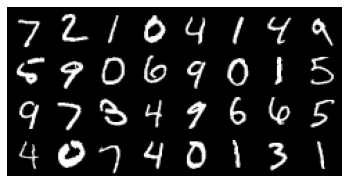

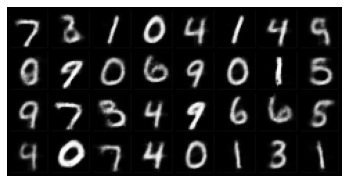

In [112]:
# VAE Tests
# TAs will change these paths as you will have provided the model files manually
"""To TAs, you should have been creating a folder with the student uid
   And the .ipynb + models in the root. Then that path is './VAE_model.pth' etc.
"""
vae = model_G = torch.jit.load('./CW_VAE/VAE_model.pth')
vae.eval()

# Check if VAE is convolutional
def recurse_cnn_check(parent, flag):
    if flag:
        return flag
    children = list(parent.children())
    if len(children) > 0:
        for child in children:
            flag = flag or recurse_cnn_check(child, flag)
    else:
        params = parent._parameters
        if 'weight' in params.keys():
            flag = params['weight'].ndim == 4
    return flag

has_cnn = recurse_cnn_check(vae, False)
print("Used CNN" if has_cnn else "Didn't Use CNN")

vae_in = make_grid(vae_denorm(vae_input), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_in)

vae_test = vae(vae_input.to(device))[0].detach()
vae_reco = make_grid(vae_denorm(vae_test), nrow=8, padding=2, normalize=False,
                range=None, scale_each=False, pad_value=0)
plt.figure()
plt.axis('off')
show(vae_reco)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Number of Parameters is 6571648 which is ok


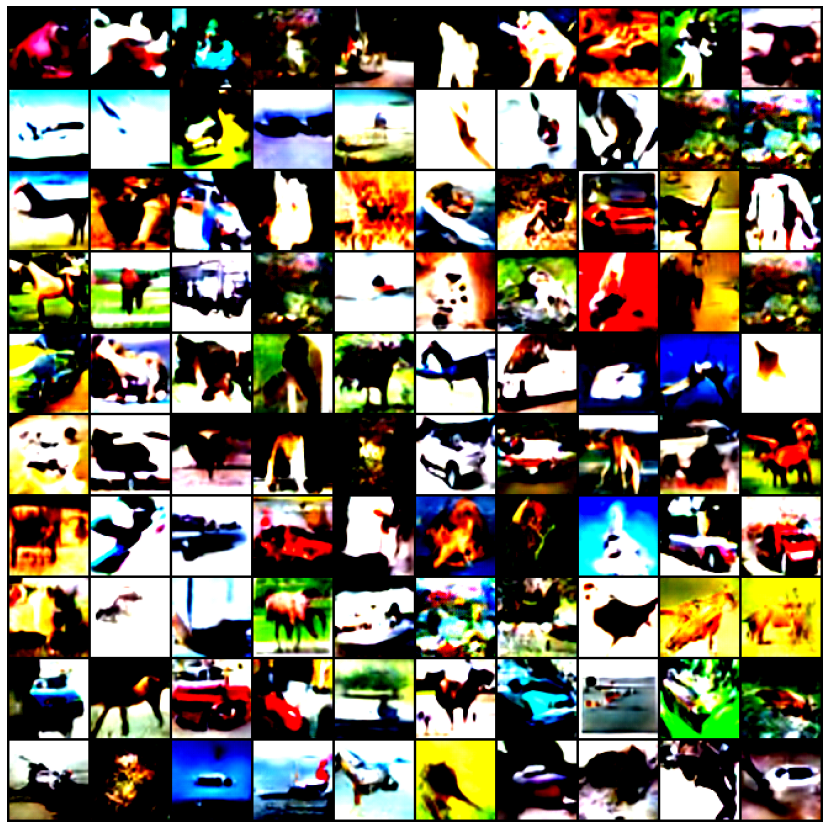

In [102]:
# GAN Tests
model_G = torch.jit.load('./CW_GAN/GAN_G_model.pth')
model_D = torch.jit.load('./CW_GAN/GAN_D_model.pth')
[model.eval() for model in (model_G, model_D)]  

# Check that GAN doesn't have too many parameters
num_param = sum(p.numel() for p in [*model_G.parameters(),*model_D.parameters()])

print(f"Number of Parameters is {num_param} which is", "ok" if num_param<25E+6 else "not ok")

# visualize the generated images
generated = model_G(*gan_input).cpu()
generated = make_grid(gan_denorm(generated)[:100].detach(), nrow=10, padding=2, normalize=False, 
                    range=None, scale_each=False, pad_value=0)
plt.figure(figsize=(15,15))
plt.axis('off')
show(generated)